# Sensor Error Notebook
This notebook contains an implementation of the FLOSS algorithm for detecting anomalous contextual changes in streaming sensor data in the presence of sensor errors. If multiple sensors zero out in random lengths and in random positions, how well does the algorithm perform? This notebook loads in the data, transforms it and outputs gifs which show the detected regime changes along with the theoretical changepoint. 

## Description of Algorithm
1. Data is loaded in and a subset of the data is picked out (with the same voltages and differing damage levels)
2. A subset of the sensors are picked to be zeroed out in random locations in the time series. 
3. At different parts of the data processing pipeline (to be described), the matrix profile and CACs are computed as more sensor data is supplied and updated, and barycentering is (potentially) performed. The resulting stream of CACs is then animated to output a gif.

# Current Notebook/Pipeline Structure 
To create an online regime change predictor, we begin with some base (transformed) data. We create a FLOSS streaming object and update the streaming object with new data. Every 100 points added, we compute the CACs, potentially barycenter CACs together, and the resulting CAC to a window, which then gets animated as a gif. We conduct experiments starting with different base data: 


1. Taking only Sensor 1: 
    - No VMD, only Welch transform. 
    - Yes VMD, Welch transform, and taking only the first VMD mode. 
    - Yes VMD, Welch transform, and barycentering across all 5 VMD modes. 
2. Taking all 24 sensors: 
    - Yes VMD, Welch transform, barycentering across all 5 VMD modes, barycentering across all 24 sensors. 
Each experiment outputs an animation of the CACs changing as we add in more data points dynamically, which we compare with the results of the other positions. 


# Importing Packages

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import stumpy # Matrix Profile
from stumpy.floss import _cac # One sided cac

import ot # Optimal Transport

from vmdpy import VMD # Variational Mode Decomposition 

from ruptures.metrics import hausdorff # Quantifying Break Point Discrepancies

# Utils
import time
import os
loc = os.getcwd() 

# Matplotlib Params
import matplotlib
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 16}

matplotlib.rc('font', **font)

from matplotlib import animation
from IPython.display import HTML

import scripts

os.chdir('/Users/wang_to/Documents/University/Anomaly_detection/anomalies/bookshelf/dataset') # change this when uploading to git


# Generic Preprocessing Steps

We first load in the data from data_dict.npy. The cases variable contains a list of cases that we are interested in for damage location, damage level and voltage. The data is always structured as follows, to be concatenated together: 10 healthy data, 5 damaged data, 5 moderately damaged data, 5 severely damaged data. 

In [19]:
data_dict = np.load('data_dict.npy', allow_pickle=True).item()
cases = [['L00','D00','V08'], ['L1C','DB0','V08'],  ['L1C','DBB','V08'], ['L13','DBB','V08']]

# for the first 8 sensors, erase some number of points between 100 and 500.
# for other experiments, see what happens if zeroing out is replaced by random normals
num_sensors = 8
bounds = (500, 1000)
rand_dict = {}

df_list = scripts.exp_list_process(data_dict, cases, 10)

# loop through sensors and zero out the data for the first num_sensors sensors.
for i in range(num_sensors):
    sensor_str = f'Sensor{i+1}'
    _, rand_positions = scripts.zero_out(df_list[sensor_str], bounds, 8192, 25, zero=True, rand=True)
    rand_dict[f'Sensor{i+1}'] = rand_positions 
    
    # note: does it even make sense to get the positions? We just want to consider qualitative outputs.

We can see below the effects of the zero_out function on the time series data. 

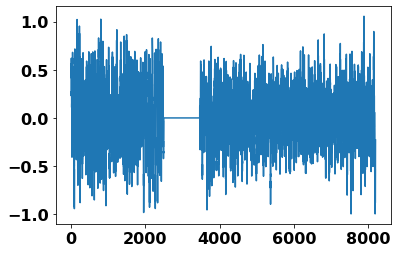

In [20]:
plt.plot(df_list['Sensor5'].iloc[21,:-4].values)

Before we compute the different FLOSS algorithms, we load in some parameters to be used, including the number of experiments used, the parameters for the variational mode decomposition and the welch transform.

In [21]:
# parameters 

alpha = 2000      # Moderate bandwidth constraint  
tau = 0.          # Noise-tolerance (no strict fidelity enforcement)  
num_modes = 5     # Num modes  
DC = 0            # No DC part imposed  
init = 0          # Initialize omegas uniformly  
tol = 1e-7        # Optimization Convergence Tolerance
fs = 1600
# Parameter for p-welch transform
nperseg = df_list['Sensor1'].shape[1]//8

num_experiments = 25 

# Total length of signal recording
signal_length = 8192 # len(X_cols_time)


# Computing FLOSS algorithm for non-VMD (only Welch)
In this section, we compute the FLOSS algorithm for the processed data only performing the Welch transform on the raw data for Sensor 1 (no VMD). 

In [22]:
# Compute the welch transform then concatenate transformed data into a single time series.
building_features = scripts.welch_vmd(df_list['Sensor1'])
building_features_seq = scripts.data_sequencing(building_features, vmd=0)

In [24]:
# Parameters to animate gif 
regime_change_idxs = [n_exp * 513 for n_exp in [10, 15, 20]] # parameter to visualise theoretical regime changes
m = 100 # window size
L = m
start_list_size = 5*513 # size of the "starting" data points

scripts.animate_regime_change(building_features_seq, 'zero-500_1000-welchonly-10fps.gif', 0, regime_change_idxs, start_list_size, m, L)

Qualitatively, after zeroing out parts of sensor 1, the algorithm is still able to detect regime changes accurately (note the correlation with the theoretical red lines and the peaks), although we see a much larger increase in noise in the CAC curve. Visually, we can reasonably detect peaks (and hence regime changes) since the main peaks are long-lasting and have larger magnitude than the surrounding noise, which could be the basis of an automated peak detector in the future.

# Computing CAC FLOSS algorithm for VMD and VMD Barycenter, Sensor 1
In this section, we compute the FLOSS algorithm for the processed data, performing VMD then the Welch transform on all 5 VMD modes. We then perform two experiments on the data for Sensor 1: using the first mode as a predictor, and using all 5 modes then barycentering the resulting CACs as a predictor.

In [25]:
# compute the vmd then welch transform of data
# building_features_vmd will be used in other parts of the notebook
building_features_vmd = scripts.welch_vmd(df_list, 8192, nperseg, fs, 5, alpha, tau, DC, init, tol)


Processing Sensor 1
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 2
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 3
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 4
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experime

## VMD[0] CACs Sensor 1
Taking the first VMD mode for Sensor 1 as a predictor for regime changes.

In [26]:
# sequence together the transformed vmd
building_features_vmd_seq = scripts.data_sequencing(building_features_vmd, vmd=5)

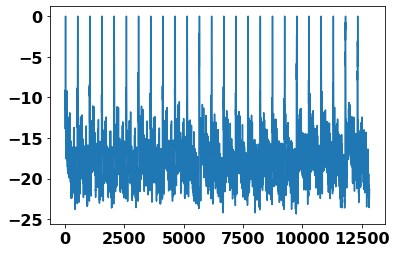

In [39]:
# visualising the concatenated time series
plt.plot(building_features_vmd_seq['Sensor1'][0])

In [28]:
regime_change_idxs = [n_exp*513 for n_exp in [10, 15, 20]]
num_modes = 0 # Only using the first vmd mode
start_list_size = 5 * 513 # starting amount of data before updating
m = 100 # window size for matrix profiling 
L = m
scripts.animate_regime_change(building_features_vmd_seq['Sensor1'][0], 'zero-500-1000-VMD_0-welchonly-10fps.gif', num_modes, regime_change_idxs, start_list_size, m, L)


## VMD[all] CACs Sensor 1
Barycentering over all 5 VMD modes for Sensor 1. 

In [29]:
regime_change_idxs = [n_exp*513 for n_exp in [10, 15, 20]]
num_modes = 5
start_list_size = 5 * 513
m = 100 
L = m
scripts.animate_regime_change(building_features_vmd_seq['Sensor1'], 'zero-500_1000-VMD_all-welchonly-10fps.gif', num_modes, regime_change_idxs, start_list_size, m, L)

Qualitatively, there is not much difference between the predictors when barycentering over all VMD modes and only taking the first VMD mode. 

## Barycenter all VMD CACs across all Sensors
In this section, we take all VMD modes, Welch transform, barycenter across the VMD modes and then barycenter over all 24 sensors as sensor points come in. The algorithm works as follows. 
1. Over the starting data and over all sensors, compute the VMDs. For each VMD, compute the matrix profile then initialise a FLOSS streaming object. 
2. Looping over all sensors and all VMD modes, update the FLOSS object with data points. For every k*100 points added in, record the CAC in cac_list[sensor_num][vmd_mode][k]. 
3. Looping over all sensors and all k*100 multiples of points, barycenter across all VMD modes. 
4. Looping over all k*100 multiples of points, barycenter across all sensors. 
5. Animate!

In [31]:
# okay - too confusing. Go back!!!

### what's the idea? 
### append cacs into a window list of tuples 

### update 100 points
### compute cacs for each mode
### barycenter together
### barycenter together all cacs afterwards



In [34]:
cac_list = dict() #to store the initial cacs for each mode 
stream = dict()
windows = []

num_sensors = 24
starting_list_size = 5*513


# This first loop computes the matrix profiles and initialises the FLOSS streaming object for the initial data. 
for i in range(num_sensors):
    sensor_str = f'Sensor{i+1}'
    stream[sensor_str] = dict()
    cac_list[sensor_str] = []
    for mode in range(num_modes): 
        vmd_str = f'vmd{mode+1}'
        old_data = building_features_vmd_seq[sensor_str][mode][:starting_list_size] # take the first 5 experiments. There are 25 experiments, with changes occuring in 10, 15, 20 
        mp = stumpy.stump(old_data, m=m)
        cac_list[sensor_str].append(_cac(mp[:, 3], L, bidirectional=False, excl_factor=1))
        vmd_str = f'vmd{mode}'
        stream[sensor_str][vmd_str] = stumpy.floss(mp, old_data, m=m, L=L, excl_factor=1)
    cac_list[sensor_str] = np.array(cac_list[sensor_str])

cac_list = np.array(cac_list)
cac_list = cac_list.item()

# now barycenter cac_list modes together 
building_cacs = scripts.compute_bary_cacs(cac_list, 10, 24, 5)
final_CAC = scripts.final_cac(building_cacs, 24, 1, False)

# now: add in new data. For every sensor and every mode, record the CACs every 100 points. 
cac_list = dict()
for j in range(num_sensors):
    sensor_str = f'Sensor{j+1}'
    cac_list[sensor_str] = dict()


    for mode in range(num_modes):
        k = 0 # counter for keeping track of multiples of 100 points passed.

        vmd_str = f'vmd{mode}'
        cac_list[sensor_str][vmd_str] = dict()

        new_data = building_features_vmd_seq[sensor_str][mode][starting_list_size:]
        current_x_window = list(np.arange(start_list_size))

        for i, t in enumerate(new_data): 

            stream[sensor_str][vmd_str].update(t) # update streaming object with new data

            #update the window of x values we are currently looking at CAC for
            current_x_window = current_x_window[1:]
            current_x_window.append(i+start_list_size)

            
            if i % 100 == 0: # every 100 points, for each mode, update the CAC, barycenter the CACs together for the vmd, then barycenter the sensors together
                # note any indices of regime changes in this x values window: this is for animating the theoretical regime change later
                regime_changes_window_idxs = [0]

                for change in regime_change_idxs:
                    if change in current_x_window:
                        regime_changes_window_idxs.append(current_x_window.index(change))


                cac_list[sensor_str][vmd_str][k] = (stream[sensor_str][vmd_str].T_, stream[sensor_str][vmd_str].cac_1d_)

                k += 1 # keeps track of number of 100 points passed 



In [35]:
cac_list_vmd = dict()

for sensor in range(num_sensors):
    sensor_str = f'Sensor{sensor+1}'
    cac_list_vmd[sensor_str] = dict()

    for k in range(102): 
        OT = [] # Will contain an array of VMD modes for the CACs corresponding to the k*100th update.

        for vmd in range(num_modes): 
            # compute barycenter among vmd modes
            vmd_str = f'vmd{vmd}'

            kth_cac = cac_list[sensor_str][vmd_str][k][1]
            OT.append(kth_cac)

        OT = np.array(OT)
    
        A = OT.T
        B = A[::10, :]
        M = ot.utils.dist0(B.shape[0])
        M /= M.max()
        M*=1e4

        final_OT = ot.barycenter_unbalanced(B, M, reg=5e-4, reg_m=1e-1) 
        cac_list_vmd[sensor_str][k] = final_OT # contains the CAC after barycentering over VMDs

In [36]:
# window should contain a nested dict with each sensor having 102 CACs; the next step is to 
# barycenter across all sensors (keeping k fixed) before appending onto window.
window = dict()

for k in range(102):

    OT = []

    for sensor in range(num_sensors):

        sensor_str = f'Sensor{sensor+1}'
        nth_sensor_cac = cac_list_vmd[sensor_str][k] 
        OT.append(nth_sensor_cac)

    OT = np.array(OT)
    A = OT.T
    B = A[:, :]
    M = ot.utils.dist0(B.shape[0])
    M /= M.max()
    M*=1e4

    final_OT = ot.barycenter_unbalanced(B, M, reg=5e-4, reg_m=1e-1) # final OT is the cac for vmd for k = 0
    window[k] = final_OT# 
    
for k in range(102):
    window[k] = np.repeat(window[k],10)

In [37]:
windows = [] # windows is a list of 3-tuples which contains the CACs and regime change indices.
current_x_window = list(np.arange(-100, -100+starting_list_size))
regime_change_idxs = [513*n for n in [10, 15, 20]]
for i in range(102):
    current_x_window = current_x_window[100:]
    last = current_x_window[-1]
    to_concat = list(last +1 + np.arange(100))
    current_x_window = current_x_window + to_concat # since we are updating every 100 points, we need to shift current x_window by that much as well
    regime_changes_window_idxs = [0]
    for change in regime_change_idxs:
        if change in current_x_window:
            regime_changes_window_idxs.append(current_x_window.index(change))
    windows.append((np.ones(starting_list_size),window[i], regime_changes_window_idxs))
    
    # np.ones is just a placeholder, since the animation code assumes a 3-tuple.

In [38]:
fig, axs = plt.subplots(2, sharex=True, gridspec_kw={'hspace': 0})

axs[0].set_xlim((0, mp.shape[0]))
Y_MIN = min(np.min(old_data), np.min(new_data))
Y_MAX = max(np.max(old_data), np.max(new_data))
axs[0].set_ylim(Y_MIN, Y_MAX)
axs[1].set_xlim((0, mp.shape[0]))
axs[1].set_ylim((-0.1, 1.1))

lines = []

for ax in axs: #create empty structures for each frame
    line, = ax.plot([], [], lw=2)
    lines.append(line)
    line, = ax.plot([],[], linewidth=2, color= 'red')
    lines.append(line)
line, = axs[1].plot([], [], lw=2) # create structure for orange curve
lines.append(line)

def init():
    for line in lines:
        line.set_data([], [])
    return lines

def animate(window):
    data_out, cac_out, regime_changes = window
    lines[0].set_data(np.arange(data_out.shape[0]), data_out)
    lines[2].set_data(np.arange(cac_out.shape[0]), cac_out)
    rgm_change = max(regime_changes)
    lines[1].set_data([rgm_change,rgm_change],[Y_MIN, Y_MAX])
    lines[3].set_data([rgm_change,rgm_change],[-0.1, 1.1])
    return lines

anim = animation.FuncAnimation(fig, animate, init_func=init,
                            frames=windows, interval=100,
                            blit=True)

writergif = animation.PillowWriter(fps = 10)

anim_out = anim.to_jshtml()
plt.close()  # Prevents duplicate image from displaying

HTML(anim_out)


We see a large difference in the resulting CAC animation. Regime changes are clearly demarked by the algorithm and the noise characteristic of the previous animations are smoothed out.